# Introduction to Customer Segmentation in Python

Welcome to this project! We will be analyzing a customer transaction dataset in order to investigate and interpret customer behaviour of a certain supplier.

We will be doing exploratory data analysis on our data, before employing a variety of dimensionality reduction techniques, ranging from introfuctory to more advanced. We will visualize our new represntation, before clustering our customers based on their behaviour. Finally, we will visualize our clusters in an interactive way to analyze them and their differences more thoroughly.


## Project Outline
**Task 1**: Introduction

**Task 2**: Exploratory Data Analysis

**Task 3**: Principal Component Analysis

**Task 4**: Kernel Principal Component Analysis

**Task 5**: K-Means Clustering with Elbow Method

**Task 6**: Interactive Cluster Analysis


## Task 1: Introduction
[This is the dataset](https://archive.ics.uci.edu/ml/datasets/Wholesale+customers) we will be using. It is collated by Margarida G. M. S. Cardoso, and comprises annual spending across different types of retail products (for example, Frozen, Grocery, Delicatessen, etc.). We will use unsupervised methods to reduce the dimensionality of this data, and plot the resulting 2-D data, and investigate what our models are learning.

### These are the concepts and tool we will use in this project.

- [Principal Component Analysis (PCA)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)
- [Kernel Principal Component Analysis (KPCA)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html)
- [K-Means Clustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
- [Elbow Method](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html)

In [1]:
import pandas as pd

In [2]:
from google.colab import drive

# Mount my Google Drive to the Colab VM.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
df = pd.read_csv('/content/drive/MyDrive/Wholesale customers data.csv')

In [4]:
df.head(10)

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185
5,2,3,9413,8259,5126,666,1795,1451
6,2,3,12126,3199,6975,480,3140,545
7,2,3,7579,4956,9426,1669,3321,2566
8,1,3,5963,3648,6192,425,1716,750
9,2,3,6006,11093,18881,1159,7425,2098


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Channel           440 non-null    int64
 1   Region            440 non-null    int64
 2   Fresh             440 non-null    int64
 3   Milk              440 non-null    int64
 4   Grocery           440 non-null    int64
 5   Frozen            440 non-null    int64
 6   Detergents_Paper  440 non-null    int64
 7   Delicassen        440 non-null    int64
dtypes: int64(8)
memory usage: 27.6 KB


In [6]:
# changing datatype of columns
df = df.astype({'Channel' :'category','Region':'category'})

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Channel           440 non-null    category
 1   Region            440 non-null    category
 2   Fresh             440 non-null    int64   
 3   Milk              440 non-null    int64   
 4   Grocery           440 non-null    int64   
 5   Frozen            440 non-null    int64   
 6   Detergents_Paper  440 non-null    int64   
 7   Delicassen        440 non-null    int64   
dtypes: category(2), int64(6)
memory usage: 21.9 KB


In [8]:
# changing the name of categories of Channel and Region
df['Channel'] = df['Channel'].map({1: 'HoReCa', 2: 'Retail'})
df['Region'] = df['Region'].map({1: 'Lisbon', 2: 'Porto', 3:'Other'})

In [9]:
df.head(10)

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185
5,Retail,Other,9413,8259,5126,666,1795,1451
6,Retail,Other,12126,3199,6975,480,3140,545
7,Retail,Other,7579,4956,9426,1669,3321,2566
8,HoReCa,Other,5963,3648,6192,425,1716,750
9,Retail,Other,6006,11093,18881,1159,7425,2098


In [10]:
df.Channel.value_counts()

,count
Channel,
HoReCa,298
Retail,142


In [11]:
df.Region.value_counts()

,count
Region,
Other,316
Lisbon,77
Porto,47


In [12]:
df.describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


## Task 2: Exploratory Data Analysis

In [13]:
# importing visualisation tools

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns

In [14]:
features = [
    'Channel',
    'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicassen'
]

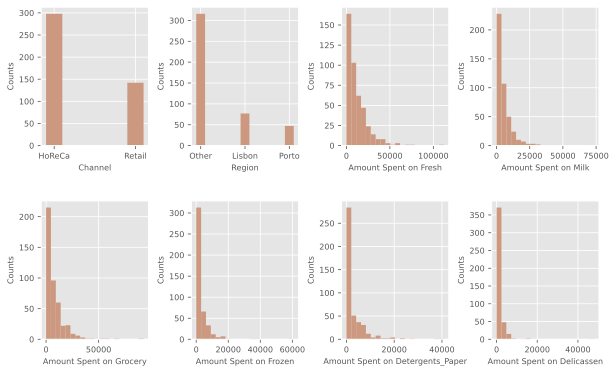

In [15]:
plt.rcParams["figure.figsize"] = (10,6)
i=2
j=0
fig, axs = plt.subplots(2, 4)
for item in features:
  if (item=='Channel') or  (item=='Region'):
    axs[0,j].bar(df[item].value_counts().index, df[item].value_counts().values, width = 0.2,color=(0.8, 0.6, 0.5))
    axs[0,j].set_xlabel(item, fontsize=8)
    axs[0,j].set_ylabel('Counts',fontsize=8)
    axs[0,j].tick_params(axis='both', labelsize=8)
    j=j+1
  else:
    axs[(i)//4,i%4].hist(df[item],color=(0.8, 0.6, 0.5),bins=20)
    axs[(i)//4,i%4].set_xlabel('Amount Spent on '+item,fontsize=8)
    axs[(i)//4,i%4].set_ylabel('Counts',fontsize=8)
    axs[(i)//4,i%4].tick_params(axis='both', labelsize=8)
    i=i+1
plt.subplots_adjust(hspace=0.4,wspace=0.4)

In [16]:
# pairwise plot of different features
sns.pairplot(df,plot_kws={'color':(34/255,139/255,34/255) },
             diag_kws={'color': (34/255,139/255,34/255)},height=2, aspect=2, kind='reg')

In [17]:
sns.pairplot(df,height=2, aspect=2,hue='Channel')

In [18]:
custom_palette = sns.color_palette(["#2ecc71", "#3498db", "#e74c3c"])
sns.set_palette(custom_palette)
sns.pairplot(df,height=2, aspect=2,hue='Region')

## Task 3: Principal Component Analysis
Let's go over some [PCA theory](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html), and see how it works!

In [19]:
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [20]:
features = [
    #'Channel',
    #'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicassen'
]

In [21]:
# converting our data to numpy array
data=df[features].to_numpy()
data.shape

(440, 6)

In [22]:
# normalising data by making mean = 0 and standard deviation = 1

scaler=StandardScaler()
std_data=scaler.fit_transform(data)
std_data[:,0].std()


np.float64(1.0)

In [23]:
std_data[0,:]

array([ 0.05293319,  0.52356777, -0.04111489, -0.58936716, -0.04356873,
       -0.06633906])

In [24]:
# Dimentionality Reduction using PCA

pca=PCA(n_components=2)
pca_data=pca.fit_transform(std_data)

In [25]:
pca_data[0,:]

array([ 0.19329055, -0.30509996])

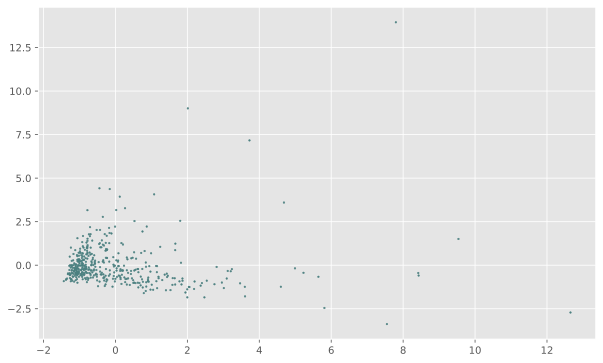

In [26]:
plt.scatter(pca_data[:,0],pca_data[:,1],color=(0.3,0.5,0.5),s=3)

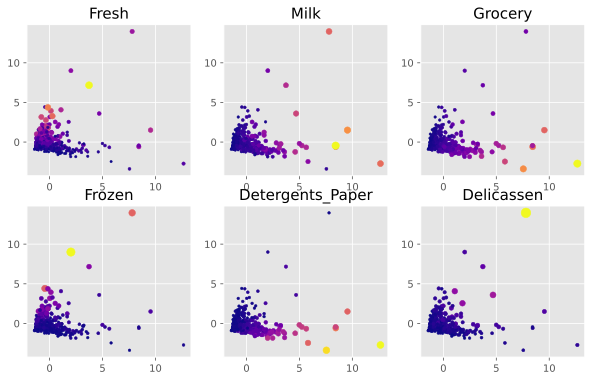

In [27]:
plt.rcParams["figure.figsize"] = (10,6)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cmap='plasma'
  sizes=10+5*std_data[:,features.index(item)]
  cols=df[item]
  axs[j//3,j%3].scatter(pca_data[:,0],pca_data[:,1],s=sizes,c=cols,cmap=cmap)
  axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

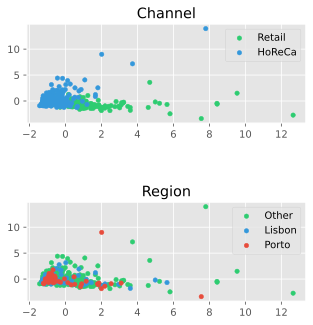

In [28]:
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'viridis'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(pca_data[df[feature]==unique_val, 0], pca_data[df[feature]==unique_val, 1], s=20,label=unique_val)
        ax.set_title(feature)
        ax.legend()
plt.subplots_adjust(hspace=0.8)

## Task 4: Kernel Principal Component Analysis
Let's go over some [KPCA theory](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html), and see see if it works better than standard PCA.

In [29]:
from sklearn.decomposition import KernelPCA

### Polynomial Function

In [30]:
kpca = KernelPCA(n_components=2, kernel='rbf', degree=2)
kpca_poly_data = kpca.fit_transform(std_data)

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


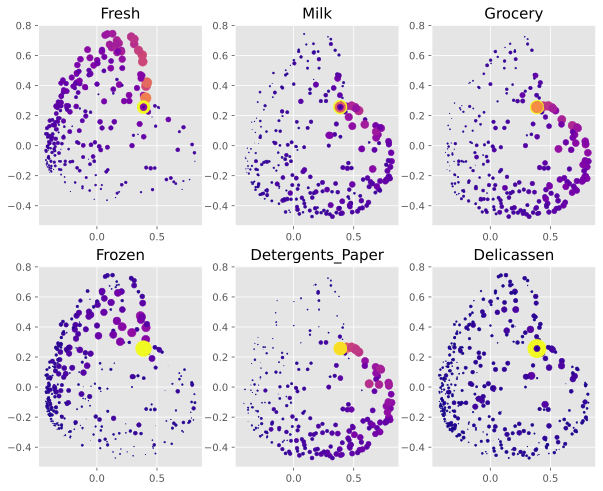

In [31]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cmap='plasma'
  sizes=10+20*std_data[:,features.index(item)]
  cols=df[item]
  axs[j//3,j%3].scatter(kpca_poly_data[:,0],kpca_poly_data[:,1],s=sizes,c=cols,cmap=cmap)
  axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

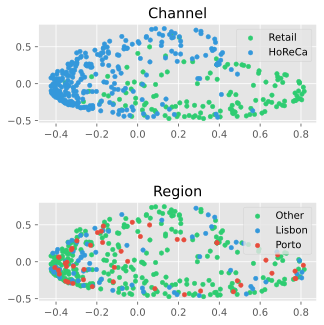

In [32]:
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'viridis'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(kpca_poly_data[df[feature]==unique_val, 0], kpca_poly_data[df[feature]==unique_val, 1],
                   s=20,label=unique_val)
        ax.set_title(feature)
        ax.legend()
plt.subplots_adjust(hspace=0.8)

### Radial Basis Function

In [33]:
kpca = KernelPCA(n_components=2, kernel='rbf')
kpca_rbf_data = kpca.fit_transform(std_data)

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


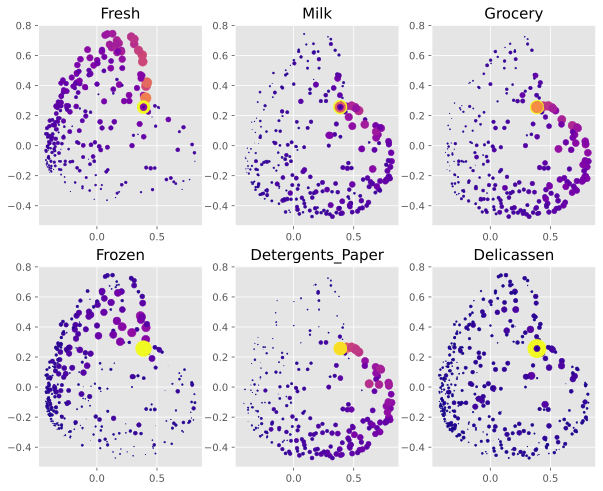

In [34]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cmap='plasma'
  sizes=10+20*std_data[:,features.index(item)]
  cols=df[item]
  axs[j//3,j%3].scatter(kpca_rbf_data[:,0],kpca_rbf_data[:,1],s=sizes,c=cols,cmap=cmap)
  axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

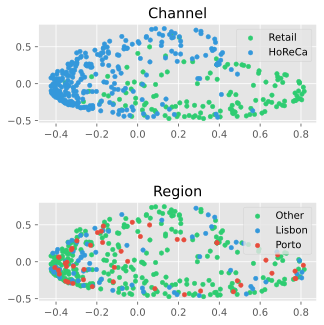

In [35]:
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'viridis'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(kpca_rbf_data[df[feature]==unique_val, 0], kpca_rbf_data[df[feature]==unique_val, 1],
                   s=20,label=unique_val)
        ax.set_title(feature)
        ax.legend()
plt.subplots_adjust(hspace=0.8)

### Cosine Function

In [36]:
kpca = KernelPCA(n_components=2, kernel='cosine')
kpca_cos_data = kpca.fit_transform(std_data)

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


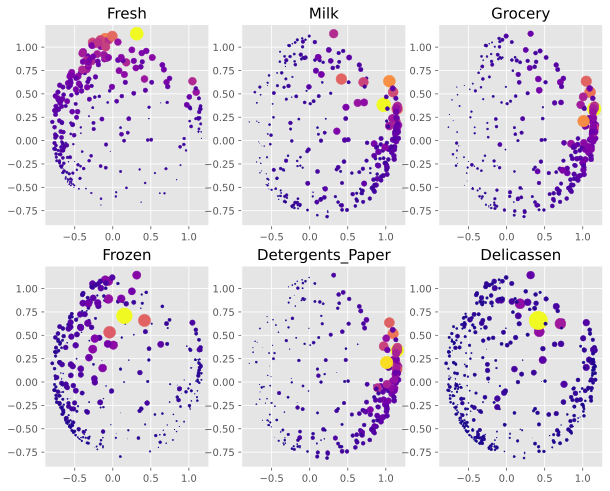

In [37]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cmap='plasma'
  sizes=10+20*std_data[:,features.index(item)]
  cols=df[item]
  axs[j//3,j%3].scatter(kpca_cos_data[:,0],kpca_cos_data[:,1],s=sizes,c=cols,cmap=cmap)
  axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

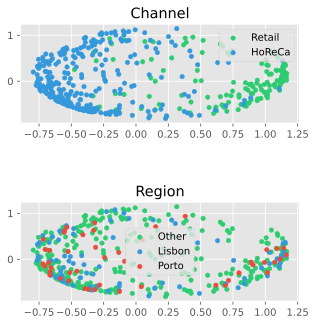

In [38]:
fig, axes = plt.subplots(2, 1, figsize=(5, 5))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'viridis'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(kpca_cos_data[df[feature]==unique_val, 0], kpca_cos_data[df[feature]==unique_val, 1],
                   s=20,label=unique_val)
        ax.set_title(feature)
        ax.legend()
plt.subplots_adjust(hspace=0.8)

## Task 5: K-Means Clustering
We'll talk about the [K-Means Clustering Algorithm](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html), and how we can use the [Elbow Method](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html) to help us out.

In [39]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

In [40]:
# choosing cosine , because best visualisation results
cluster_model = KMeans(n_clusters=5)
clusters=cluster_model.fit_predict(kpca_cos_data)

In [41]:
clusters[0:5]

array([0, 3, 3, 1, 4], dtype=int32)

In [42]:
# different way of plotting data from matplotlib
markers = list('*hH+xXDd|.,ov^<>12348spP')

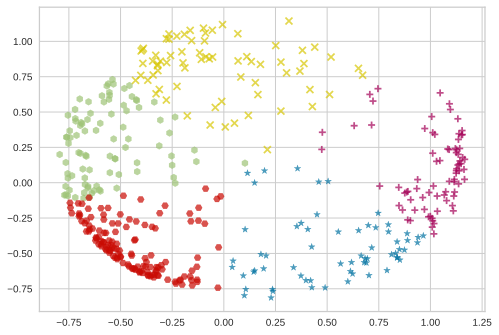

In [43]:
for cluster in np.unique(clusters):
    cluster_data = kpca_cos_data[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.7, marker=markers[cluster])

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/tmp/ipython-input-3485142088.py:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[j//3,j%3].scatter(cluster_data[:,0],cluster_data[:,1],s=sizes


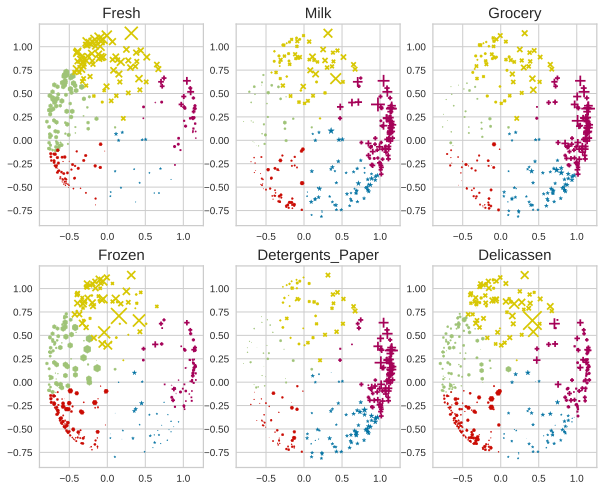

In [44]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cols='plasma'
  for cluster in np.unique(clusters):
    sizes=10+20*std_data[:,features.index(item)][cluster==clusters]
    cluster_data = kpca_cos_data[clusters==cluster]
    axs[j//3,j%3].scatter(cluster_data[:,0],cluster_data[:,1],s=sizes
                          ,cmap=cols,marker=markers[cluster], label=f'Cluster {cluster}')
    axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

### Elbow Method

In [45]:
KElbowVisualizer?

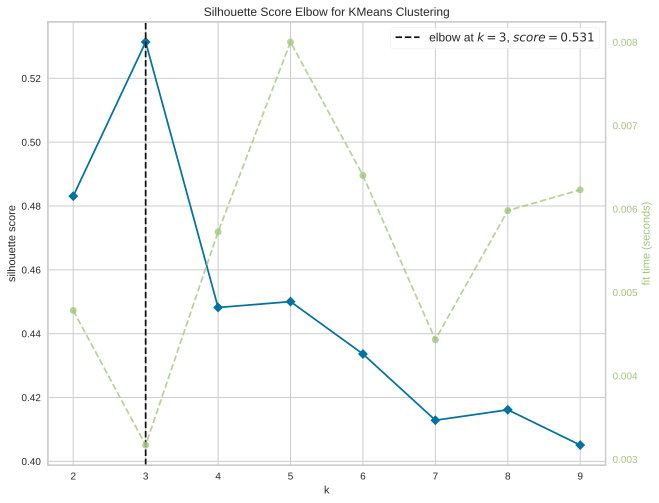

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [46]:
cluster_model=KMeans()
visual=KElbowVisualizer(cluster_model,k=(2,10),metric='silhouette')
visual.fit(kpca_cos_data)
visual.show()

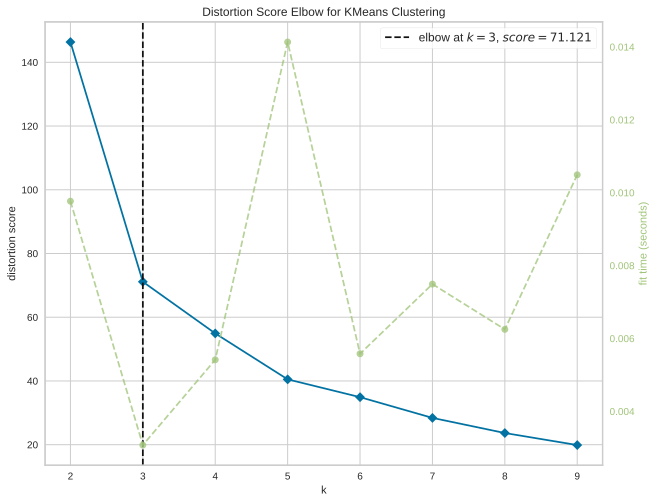

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [47]:
cluster_model=KMeans()
visual=KElbowVisualizer(cluster_model,k=(2,10),metric='distortion')
visual.fit(kpca_cos_data)
visual.show()

In [48]:
cluster_model = KMeans(n_clusters=3)
clusters=cluster_model.fit_predict(kpca_cos_data)

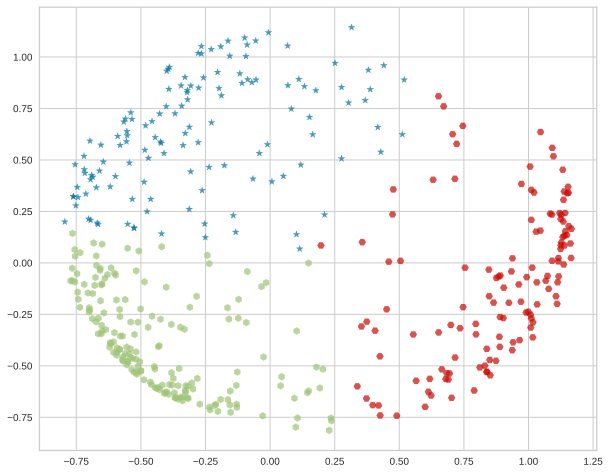

In [49]:
for cluster in np.unique(clusters):
    cluster_data = kpca_cos_data[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.7, marker=markers[cluster])

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/tmp/ipython-input-3485142088.py:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[j//3,j%3].scatter(cluster_data[:,0],cluster_data[:,1],s=sizes


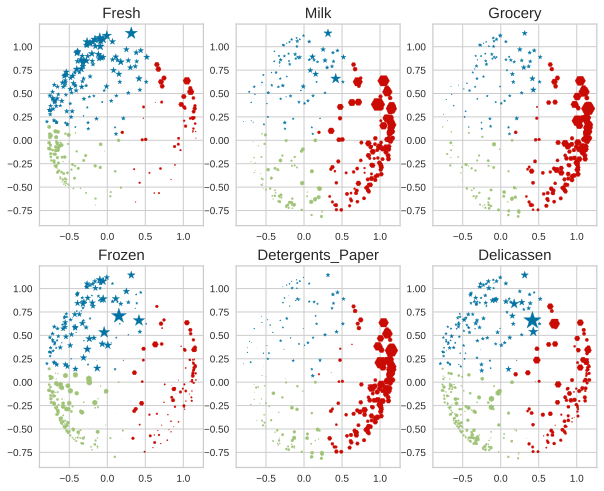

In [50]:
plt.rcParams["figure.figsize"] = (10,8)
j=0
fig, axs = plt.subplots(2, 3)
for item in features:
  cols='plasma'
  for cluster in np.unique(clusters):
    sizes=10+20*std_data[:,features.index(item)][cluster==clusters]
    cluster_data = kpca_cos_data[clusters==cluster]
    axs[j//3,j%3].scatter(cluster_data[:,0],cluster_data[:,1],s=sizes
                          ,cmap=cols,marker=markers[cluster], label=f'Cluster {cluster}')
    axs[j//3,j%3].set_title(item, fontsize=15)
  j=j+1

## Task 6: Interactive Cluster Analysis
lets say from industry experience we know there are 5 different types of customers that we want to market to

In [51]:
cluster_model = KMeans(n_clusters=5)
clusters=cluster_model.fit_predict(kpca_cos_data)

In [52]:
df['cluster']=clusters

In [53]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,cluster
0,Retail,Other,12669,9656,7561,214,2674,1338,2
1,Retail,Other,7057,9810,9568,1762,3293,1776,2
2,Retail,Other,6353,8808,7684,2405,3516,7844,3
3,HoReCa,Other,13265,1196,4221,6404,507,1788,4
4,Retail,Other,22615,5410,7198,3915,1777,5185,0


In [54]:
df.groupby(['cluster','Channel','Region']).count()

/tmp/ipython-input-1960169853.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['cluster','Channel','Region']).count()


Fresh  Milk  Grocery  Frozen  Detergents_Paper  \
cluster Channel Region                                                   
0       HoReCa  Lisbon      9     9        9       9                 9   
                Porto       5     5        5       5                 5   
                Other      52    52       52      52                52   
        Retail  Lisbon      2     2        2       2                 2   
                Porto       1     1        1       1                 1   
                Other       5     5        5       5                 5   
1       HoReCa  Lisbon     24    24       24      24                24   
                Porto      10    10       10      10                10   
                Other      86    86       86      86                86   
        Retail  Lisbon      2     2        2       2                 2   
                Porto       2     2        2       2                 2   
                Other       7     7        7       7                 7   
2       HoReCa  Lisbon      4     4        4       4                 4   
                Porto       0     0        0       0                 0   
                Other      10    10       10      10                10   
        Retail  Lisbon     14    14       14      14                14   
                Porto      14    14       14      14                14   
                Other      70    70       70      70                70   
3       HoReCa  Lisbon      4     4        4       4                 4   
                Porto       1     1        1       1                 1   
                Other      10    10       10      10                10   
        Retail  Lisbon      0     0        0       0                 0   
                Porto       2     2        2       2                 2   
                Other      21    21       21      21                21   
4       HoReCa  Lisbon     18    18       18      18                18   
                Porto      12    12       12      12                12   
                Other      53    53       53      53                53   
        Retail  Lisbon      0     0        0       0                 0   
                Porto       0     0        0       0                 0   
                Other       2     2        2       2                 2   

                        Delicassen  
cluster Channel Region              
0       HoReCa  Lisbon           9  
                Porto            5  
                Other           52  
        Retail  Lisbon           2  
                Porto            1  
                Other            5  
1       HoReCa  Lisbon          24  
                Porto           10  
                Other           86  
        Retail  Lisbon           2  
                Porto            2  
                Other            7  
2       HoReCa  Lisbon           4  
                Porto            0  
                Other           10  
        Retail  Lisbon          14  
                Porto           14  
                Other           70  
3       HoReCa  Lisbon           4  
                Porto            1  
                Other           10  
        Retail  Lisbon           0  
                Porto            2  
                Other           21  
4       HoReCa  Lisbon          18  
                Porto           12  
                Other           53  
        Retail  Lisbon           0  
                Porto            0  
                Other            2

In [55]:
df.groupby(['cluster','Channel','Region'])[features].mean()

/tmp/ipython-input-357625930.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['cluster','Channel','Region'])[features].mean()


Fresh          Milk       Grocery  \
cluster Channel Region                                             
0       HoReCa  Lisbon  34766.555556   3129.444444   3951.222222   
                Porto   23227.800000   2672.000000   4426.000000   
                Other   29153.038462   3985.846154   4043.596154   
        Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                Porto   16823.000000    928.000000   2743.000000   
                Other   28092.000000   4624.200000   6268.800000   
1       HoReCa  Lisbon   4955.625000   2912.791667   2884.166667   
                Porto    5156.000000   1679.200000   4258.000000   
                Other    4078.500000   2643.383721   2916.081395   
        Retail  Lisbon   2665.500000   3632.000000   5677.000000   
                Porto    7839.000000   2548.000000   6110.000000   
                Other    7760.571429   4212.857143   7097.857143   
2       HoReCa  Lisbon   4430.250000   8161.250000  10965.500000   
                Porto            NaN           NaN           NaN   
                Other    3999.800000   6417.900000  10881.100000   
        Retail  Lisbon   4029.642857  12495.571429  21879.571429   
                Porto    4462.500000  11110.071429  19863.357143   
                Other    5008.971429  10948.342857  17170.271429   
3       HoReCa  Lisbon  17754.250000  15236.750000  11225.750000   
                Porto   32717.000000  16784.000000  13626.000000   
                Other   29157.800000  14572.100000  12665.800000   
        Retail  Lisbon           NaN           NaN           NaN   
                Porto   21765.000000   6530.000000   8575.000000   
                Other   21723.095238  15676.238095  18239.142857   
4       HoReCa  Lisbon  13370.055556   2037.666667   2444.222222   
                Porto   10483.250000   1465.250000   3728.166667   
                Other   13773.283019   1721.849057   2331.735849   
        Retail  Lisbon           NaN           NaN           NaN   
                Porto            NaN           NaN           NaN   
                Other   15355.500000   2405.000000   4590.000000   

                              Frozen  Detergents_Paper    Delicassen  
cluster Channel Region                                                
0       HoReCa  Lisbon   6097.888889        575.000000   1995.111111  
                Porto    3276.200000        342.000000   1439.800000  
                Other    7333.134615        636.942308   1613.942308  
        Retail  Lisbon   5040.000000       1761.500000   1845.000000  
                Porto   11559.000000        332.000000   3486.000000  
                Other    3001.800000       1582.000000   2294.000000  
1       HoReCa  Lisbon   1502.708333        874.083333    632.041667  
                Porto    1628.800000        522.900000    834.600000  
                Other    1474.000000        640.034884    855.965116  
        Retail  Lisbon   4279.000000       3052.000000    740.000000  
                Porto     936.000000       2960.000000    392.500000  
                Other     620.142857       2897.714286    440.142857  
2       HoReCa  Lisbon    994.250000       4274.750000   1453.000000  
                Porto            NaN               NaN           NaN  
                Other    1596.800000       3908.500000   1112.400000  
        Retail  Lisbon   1991.142857       9887.714286   2037.500000  
                Porto     975.071429      10483.571429   1080.428571  
                Other    1332.442857       7740.600000   1531.528571  
3       HoReCa  Lisbon   5084.500000        756.000000   3786.500000  
                Porto   60869.000000       1272.000000   5609.000000  
                Other    9174.700000       1757.800000  10763.400000  
        Retail  Lisbon           NaN               NaN           NaN  
                Porto    1094.500000       3386.500000   2072.000000  
                Other    2085.047619       7239.619048   3277.571429  
4       

In [56]:
df.groupby('cluster').count()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
cluster,,,,,,,,
0,74,74,74,74,74,74,74,74
1,131,131,131,131,131,131,131,131
2,112,112,112,112,112,112,112,112
3,38,38,38,38,38,38,38,38
4,85,85,85,85,85,85,85,85


In [57]:
biggest_cluster_entries=df.groupby('cluster').count().max().max()
biggest_cluster_entries

131

In [58]:
clusters=df.cluster.tolist()

In [59]:
df_normalised =df.copy(deep=True)
df_normalised [features] = df_normalised [features]/df_normalised [features].max()

In [60]:
df_normalised.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,cluster
0,Retail,Other,0.112964,0.131378,0.081494,0.003516,0.065496,0.027908,2
1,Retail,Other,0.062924,0.133473,0.103126,0.028947,0.080657,0.037044,2
2,Retail,Other,0.056647,0.119840,0.082820,0.039511,0.086119,0.163611,3
3,HoReCa,Other,0.118278,0.016273,0.045495,0.105210,0.012418,0.037294,4
4,Retail,Other,0.201648,0.073607,0.077581,0.064318,0.043525,0.108149,0


In [61]:
import plotly.graph_objects as go

In [62]:
fig = go.Figure()

for cluster in np.unique(clusters):

    radii = df_normalised.loc[df_normalised.cluster==cluster, features].mean().tolist()
    thetas = features

    actual_values = df.loc[df.cluster==cluster, features].mean().tolist()
    cluster_size = len(df[df.cluster==cluster])
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster {cluster}',
            text = [f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            line=dict(width=3),
            opacity=np.max([cluster_size/biggest_cluster_entries, 0.6])
        )
    )

fig.update_layout(
    title='Cluster Analysis',
    showlegend=True,
    template='plotly_dark',
    width=800,
    autosize=False
)

fig.show()

/usr/local/lib/python3.12/dist-packages/kaleido/__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [63]:
fig.write_html('Result.html')